In [1]:
include("src/utils/diffusion_funcs.jl")
using Distributions, Plots, LinearAlgebra, SpecialFunctions

$$
\frac{\partial^2u}{\partial t^2} = c^2 \left( \frac{\partial^2u}{\partial x^2}  + \frac{\partial^2u}{\partial y^2}
\right)
$$

In [2]:

const spacesteps = 100::Int64
const L = 1.00::Float64
const h = (L/spacesteps)::Float64

const c = 1.00::Float64

const endtime = 1.00::Float64
const dt = h/(2*c)#1e-4::Float64
const timesteps = Int64(div(endtime,dt)+1)::Int64


200

In [3]:
function solve_u(u, timesteps, β)

    u[2:end-1, 2:end-1, 2] = u[2:end-1, 2:end-1, 1] + β * (u[2:end-1, 3:end, 1] - 2*u[2:end-1, 2:end-1, 1] + u[2:end-1, 1:end-2, 1] +
                                u[3:end, 2:end-1, 1] - 2*u[2:end-1, 2:end-1, 1] + u[1:end-2, 2:end-1, 1])

    for n in 2:timesteps-1
            u[2:end-1, 2:end-1, n+1] = 2*u[2:end-1, 2:end-1, n] - u[2:end-1, 2:end-1, n-1] + β * (u[2:end-1, 3:end, n] - 2*u[2:end-1, 2:end-1, n] + u[2:end-1, 1:end-2, n] +
                                                                        u[3:end, 2:end-1, n] - 2*u[2:end-1, 2:end-1, n] + u[1:end-2, 2:end-1, n])        
    end
    return u
end

function analytical_step(x,y,t)
    return cos(sqrt(5) * π * t) * sin(π * x) * sin(2 *π * y)
end

function analytical_solution(x, y, t, spacesteps, timesteps)
    u_an = zeros(spacesteps,spacesteps,timesteps)
    for n in 1:timesteps
        u_an[:,:,n] = analytical_step.(x',y,time[n])
    end  
    return u_an
end


analytical_solution (generic function with 1 method)

In [4]:
x = reduce(vcat, [0, cumsum(fill(L/(spacesteps-1), spacesteps-1))])
y = reduce(vcat, [0, cumsum(fill(L/(spacesteps-1), spacesteps-1))])

time = LinRange(0,endtime, timesteps)

β = (c*dt/h)^2

u = zeros(spacesteps, spacesteps, timesteps)

u_init = sin.(pi*x') .* sin.(2*pi*y) 
u_init[:,1] .= 0
u_init[:,end] .= 0
u_init[1,:] .= 0
u_init[end,:] .= 0

u[:,:,1] = u_init
                    
u = solve_u(u, timesteps, β)

print()

┌ Info: Saved animation to d:\Uni\Computational Physics\Computational_Physics_v24\Computational_Physics_v24\Diffusion_Waves_Shock\figures\waves\wave_equation_solution_3d.gif
└ @ Plots C:\Users\emoeu\.julia\packages\Plots\sxUvK\src\animation.jl:156


Plots.AnimatedGif("d:\\Uni\\Computational Physics\\Computational_Physics_v24\\Computational_Physics_v24\\Diffusion_Waves_Shock\\figures\\waves\\wave_equation_solution_3d.gif")
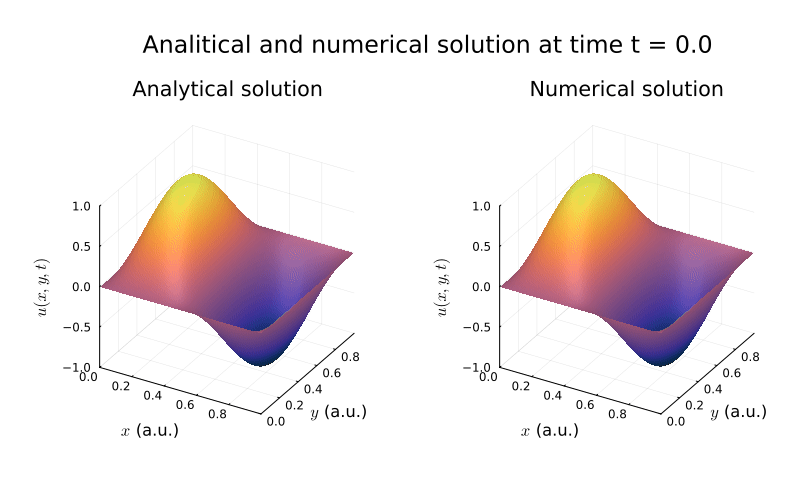

In [5]:
u_an = analytical_solution(x,y,time,spacesteps, timesteps)
anim = @animate for n in 1:10:timesteps
    p1 = surface(x, y, u_an[:, :, n]', zlim=(-1, 1), c=:thermal, colorbar = false, title = "\n\nAnalytical solution", xlabel = "\$x\$ (a.u.)", ylabel = "\$y\$ (a.u.)", zlabel = "\$u(x,y,t)\$")
    p2 = surface(x, y, u[:, :, n]', zlim=(-1, 1), c=:thermal, colorbar = false, title = "\n\nNumerical solution", xlabel = "\$x\$ (a.u.)", ylabel = "\$y\$ (a.u.)", zlabel = "\$u(x,y,t)\$")
    p = plot(p1,p2, layout= (1,2), size = (800,500), suptitle = "\nAnalitical and numerical solution at time t = $(round(time[n], digits = 4))")
end

gif(anim, "figures/waves/wave_equation_solution_3d.gif", fps=10)

┌ Info: Saved animation to d:\Uni\Computational Physics\Computational_Physics_v24\Computational_Physics_v24\Diffusion_Waves_Shock\figures\waves\wave_equation_solution_ex33.gif
└ @ Plots C:\Users\emoeu\.julia\packages\Plots\sxUvK\src\animation.jl:156


Plots.AnimatedGif("d:\\Uni\\Computational Physics\\Computational_Physics_v24\\Computational_Physics_v24\\Diffusion_Waves_Shock\\figures\\waves\\wave_equation_solution_ex33.gif")
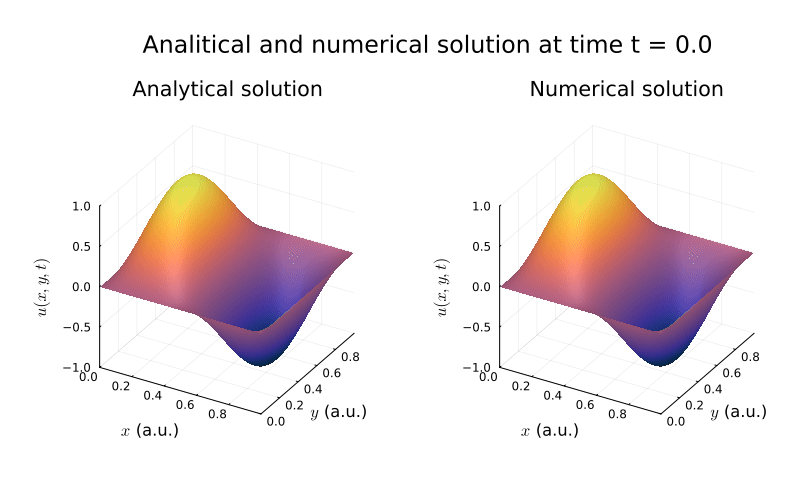

In [24]:
dt = h/(c)
endtime = 1.00
timesteps = Int64(div(endtime,dt)+1)::Int64

time = LinRange(0,endtime, timesteps)

u = zeros(spacesteps, spacesteps, timesteps)

u_init = sin.(pi*x') .* sin.(2*pi*y) 
u_init[:,1] .= 0
u_init[:,end] .= 0
u_init[1,:] .= 0
u_init[end,:] .= 0

u[:,:,1] = u_init

u = solve_u(u, timesteps, β)
u_an = analytical_solution(x,y,time, spacesteps,timesteps)

anim = @animate for n in 1:timesteps
    p1 = surface(x, y, u_an[:, :, n]', zlim=(-1, 1), c=:thermal, colorbar = false, title = "\n\nAnalytical solution", xlabel = "\$x\$ (a.u.)", ylabel = "\$y\$ (a.u.)", zlabel = "\$u(x,y,t)\$")
    p2 = surface(x, y, u[:, :, n]', zlim=(-1, 1), c=:thermal, colorbar = false, title = "\n\nNumerical solution", xlabel = "\$x\$ (a.u.)", ylabel = "\$y\$ (a.u.)", zlabel = "\$u(x,y,t)\$")
    p = plot(p1,p2, layout= (1,2), size = (800,500), suptitle = "\nAnalitical and numerical solution at time t = $(round(time[n], digits = 4))")
end

gif(anim, "figures/waves/wave_equation_solution_ex33.gif", fps=10)

┌ Info: Saved animation to d:\Uni\Computational Physics\Computational_Physics_v24\Computational_Physics_v24\Diffusion_Waves_Shock\figures\waves\wave_equation_solution_membrane.gif
└ @ Plots C:\Users\emoeu\.julia\packages\Plots\sxUvK\src\animation.jl:156


Plots.AnimatedGif("d:\\Uni\\Computational Physics\\Computational_Physics_v24\\Computational_Physics_v24\\Diffusion_Waves_Shock\\figures\\waves\\wave_equation_solution_membrane.gif")
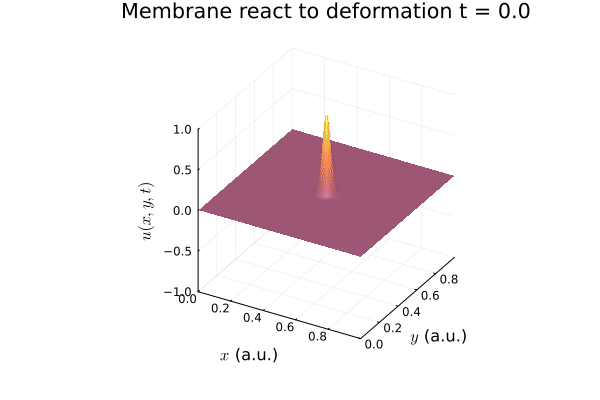

In [31]:
const x0 = 0.5::Float64
const y0 = 0.5::Float64
const σ = 0.001::Float64

function init(x,y)
    return exp(-((x - x0)^2 +(y - y0)^ 2) / σ)
    
end
dt = h/(2*c)
endtime = 3.00
timesteps = Int64(div(endtime,dt)+1)::Int64

time = LinRange(0,endtime, timesteps)

u = zeros(spacesteps, spacesteps, timesteps)

u_init = init.(x',y)
u_init[:,1] .= 0
u_init[:,end] .= 0
u_init[1,:] .= 0
u_init[end,:] .= 0

u[:,:,1] = u_init

u = solve_u(u, timesteps, β)
u_an = analytical_solution(x,y,time, spacesteps,timesteps)

anim = @animate for n in 1:timesteps
    surface(x, y, u[:, :, n]', zlim=(-1, 1), c=:thermal, colorbar = false, title = "Membrane react to deformation t = $(round(time[n], digits = 2))", xlabel = "\$x\$ (a.u.)", ylabel = "\$y\$ (a.u.)", zlabel = "\$u(x,y,t)\$")
end

gif(anim, "figures/waves/wave_equation_solution_membrane.gif", fps=20)